In [1163]:
import numpy as np
import pandas as pd
from numpy.random import randn
import scipy
from scipy import stats
import matplotlib.pyplot as plt
%matplotlib inline
import os

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.transforms as mtransforms
import imp
import align_utils
import pf_utils
imp.reload(align_utils)
imp.reload(pf_utils)

from align_utils import *
from pf_utils import *

import random
import particle_filter
imp.reload(particle_filter)
from particle_filter import *
import pandas as pd
seq = 23
inertial = np.loadtxt('seq_'+str(seq)+'.txt') #t,ux,uy,x,y

wifi = pd.read_pickle("seq_"+str(seq)+"_part.pickle")
gt = np.load("gt_"+str(seq)+".npy")

In [1164]:
def find_nearest(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return idx

In [1165]:
start = np.array(list(wifi.keys()))[0]


In [1166]:
wifi_time =  np.array(list(wifi.keys()))

In [1167]:
ox = wifi.get(start)[0][0]
oy = wifi.get(start)[0][1]

In [1168]:
def location_likelihood(p, wifi):
    likelihood = 0
    wifi = np.array(wifi)
    first_kx,first_ky,_,_=wifi[0]
    
    for data in wifi[:3]:
    
        known_x,known_y,uncer,dist = data
    #     d = math.hypot(p.x - known_x, p.y - known_y)
    # return math.exp(-0.5*(d*d)/(uncer*uncer)) + 0.0001
        # if uncer > 1.5:
        #     continue
        if math.hypot(first_kx - known_x, first_ky - known_y) > 5:
            continue
        # if dist > 8:
        #     continue
        # uncer = 1.5
        dist = random.gauss(3,np.sqrt(np.exp(uncer)))
        d = math.hypot(p.x - known_x, p.y - known_y)
        likelihood += -0.001*((d-dist)**2)
    if likelihood == 0:
        return 0.0001
    return math.exp(likelihood) + 0.0001

def location_likelihood_gt(particles, wifi):
    likelihood = 0
    likelihood_array = []
    wifi = np.array(wifi)
    for p in particles:
        known_x,known_y,uncer,dist = wifi[0]
        dist = random.gauss(dist,np.sqrt(np.exp(uncer)))
        d = math.hypot(p[0] - known_x, p[1] - known_y)
        likelihood = math.exp(-0.01*((d)**2)) + 0.0001
        likelihood_array.append(likelihood)
    return np.array(likelihood_array)

# 
# raw = pd.read_csv('gt_fixes.csv')

def plot_histories(cloud,wifi_index):
    for p in cloud.particles:
        plt.plot(*zip(*p.history), '-')
    plt.plot(gt[:,1],gt[:,2],label='gt')
    if wifi_index > 1:
        wifi_index -= 1
    wifi_arr = wifi.get(wifi_time[wifi_index])
    plt.scatter(wifi_arr[0,0],wifi_arr[0,1],label='wifi',marker="*",s=40,c='black',zorder=5)

    print("wifi dist/uncer: ",end=' ')
    print(wifi_arr[0,2],wifi_arr[0,3])
    plt.axis('equal')
    plt.show()
def plot_mean_histories(mean,wifi_index,path = None):
    plt.plot(mean[:,0],mean[:,1],c='red',zorder=5)
    plt.scatter(mean[-1,0],mean[-1,1],marker="*",s=40,zorder=5,c='red',label='latest point')

    plt.plot(gt[:,1],gt[:,2])
    if wifi_index > 1:
        wifi_index -= 1
    wifi_arr = wifi.get(wifi_time[wifi_index])
    plt.scatter(wifi_arr[0,0],wifi_arr[0,1],marker="*",s=30,c='black',label='wifi top 1')
    plt.legend()
    plt.axis('equal')
    if path is not None:
        plt.savefig(path+str(len(mean))+"_.png")
    else:
        plt.show()

In [1169]:
start_gt_index = find_nearest(gt[:,0],int(start)/10)

In [1170]:
ox = gt[start_gt_index][1]
oy = gt[start_gt_index][2]

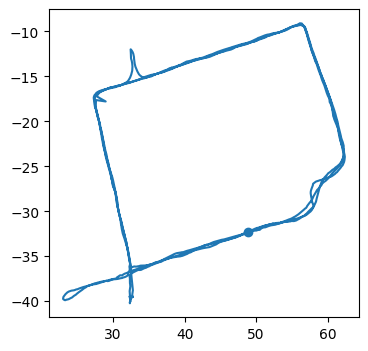

In [1171]:

plt.plot(gt[:,1],gt[:,2])

plt.scatter(gt[510,1],gt[510,2])


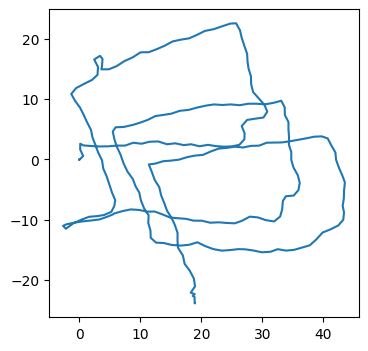

In [1172]:
imu_x = [0]
imu_y = [0]
for i in inertial:
    imu_x.append(imu_x[-1]+i[3])
    imu_y.append(imu_y[-1]+i[4])
plt.plot(imu_x,imu_y)

In [1173]:
imu_uncer = inertial[:,1] + inertial[:,2]

In [1174]:
wifi_uncer = []
for t in wifi:
    wifi_uncer.append(wifi.get(t)[0,2])
np.mean(wifi_uncer)

0.6967845006900675

134.60000000149012 292.6000000014901
92.20000000298023 266.20000000298023
21.700000002980232 162.70000000298023
24.200000002980232 211.20000000298023
39.899999998509884 188.89999999850988
81.39999999850988 231.39999999850988
Resampling
69.5 82.5
68.39999999850988 77.60000000149012
65.20000000298023 109.79999999701977
Resampling
15.399999998509884 136.60000000149012
Resampling
8.0 172.0
28.799999997019768 202.79999999701977
46.5 195.5
Resampling
65.0 223.0
42.79999999701977 117.20000000298023
54.100000001490116 95.89999999850988


C:\Users\ericw\AppData\Local\Temp\ipykernel_30536\2617722151.py:89: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


19.600000001490116 115.39999999850988
18.5 158.5
65.60000000149012 232.60000000149012
2.7999999970197678 137.20000000298023
30.700000002980232 167.70000000298023
33.29999999701977 167.29999999701977
50.29999999701977 99.70000000298023
37.79999999701977 196.79999999701977
94.20000000298023 246.20000000298023
55.79999999701977 143.20000000298023
Resampling
75.0 87.0
41.70000000298023 216.70000000298023
Resampling
72.5 237.5
16.799999997019768 173.79999999701977
Resampling
48.600000001490116 90.39999999850988
Resampling
25.600000001490116 117.39999999850988
29.100000001490116 114.89999999850988
Resampling
42.399999998509884 110.60000000149012
Resampling
4.600000001490116 147.60000000149012
Resampling
5.399999998509884 179.39999999850988
76.60000000149012 222.60000000149012
Resampling
33.899999998509884 192.89999999850988
Resampling
58.70000000298023 222.70000000298023
Resampling
69.70000000298023 228.70000000298023
Resampling
74.60000000149012 98.39999999850988
Resampling
38.7000000029802

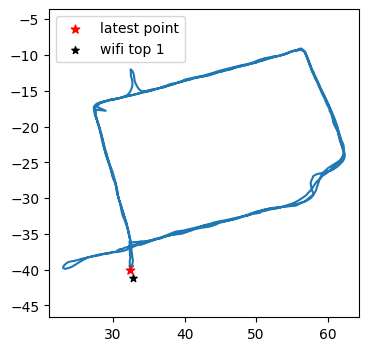

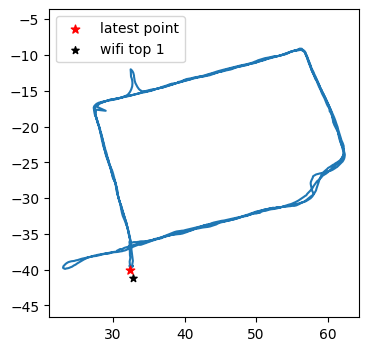

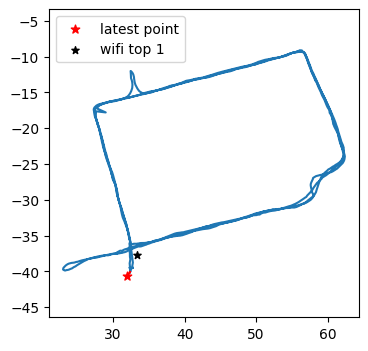

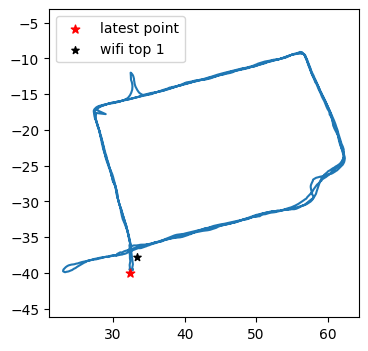

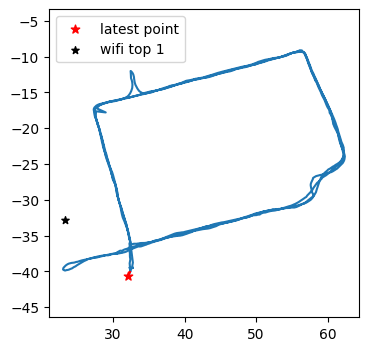

...

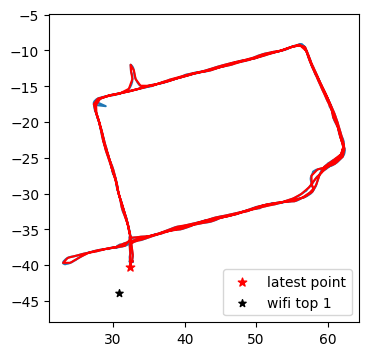

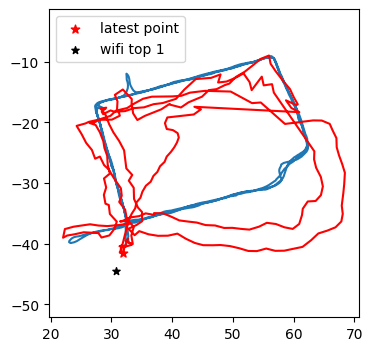

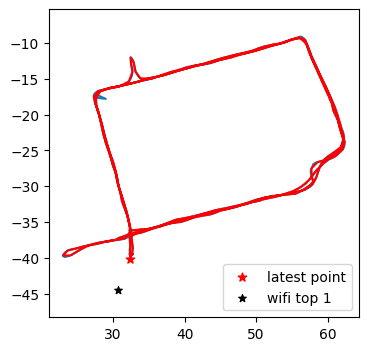

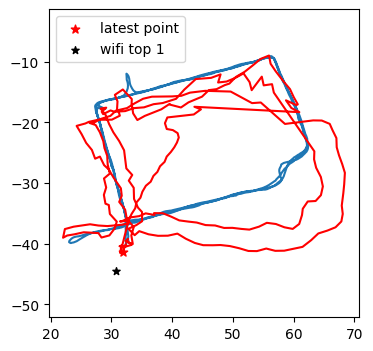

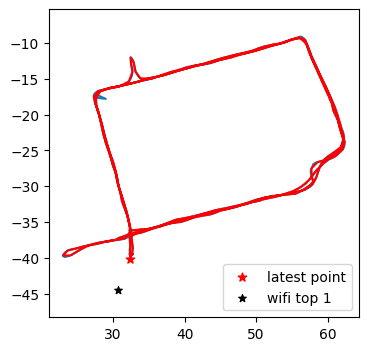

<Figure size 400x400 with 0 Axes>

In [1177]:
imu_wifi_online = None
imu_wifi_offline = None
imu_online = None
imu_offline = None
wifi_online = None
wifi_offline = None
none_online = None
none_offline = None
for use_wifi_dev in [True]:
    for use_imu_dev in [True]:
        def location_likelihood(p, wifi):
            likelihood = 0
            wifi = np.array(wifi)
            for data in wifi[:3]:
                known_x,known_y,uncer,dist = data
                uncer = uncer if use_wifi_dev else np.mean(wifi_uncer)
                dist = random.gauss(3,np.sqrt(np.exp(uncer)))
                d = math.hypot(p.x - known_x, p.y - known_y)
                likelihood += -0.02*((d)**2) * np.exp(uncer)**2
            return (math.exp(likelihood)+ 0.0001) 
        p_count = 1000
        plt.rcParams["figure.figsize"] = (4,4)
        cloud = Cloud(p_count, Particle(0, 0, 0))
        controls = extract_control(xs=imu_x[1:],ys=imu_y[1:],ts=inertial[:,0])
        init_move = (ox,oy,0)
        cloud.set_pose(controls[0][0] + init_move[0], controls[0][1] + init_move[1], controls[0][2] + init_move[2])
        for p in cloud.particles:
            p.x += random.gauss(0, 1)
            p.y += random.gauss(0, 1)
            p.scale = 1.1+ random.gauss(0, 0.1)
            p.a =  np.random.uniform(0,1) *2*  np.pi 
        cloud.record_history()
        dev = (0.01, 0.1, 0.2)
        dev_roughen = (0.1, 0.1, math.pi*0.01)
        particle_array = []
        observation_array = []
        gt_array = []
        location_index = 0
        mean = []
        gt_sync = []
        count = 0
        gt_likelihood = []
        i = 2
        for i in range(len(controls)):
            ctrl = controls[i]
            # print(ctrl)
            t = ctrl[3]
            if i < len(controls)-1:
                t_next =controls[i+1][3]
            else:
                t_next = 0
            un_mean = np.mean(imu_uncer)
            dev = (imu_uncer[i]/(un_mean/0.3),
            imu_uncer[i]/(un_mean/0.3),
            imu_uncer[i]/(un_mean/0.02)) if use_imu_dev else (0.1, 0.1, 0.02)
            if t < float(start)/10:
                continue
            
            cloud.move(ctrl, dev)
            cloud.record_history()
            mean.append(cloud.estimate())
            gt_idx = find_nearest(gt[:,0],t)
            gt_x = gt[gt_idx,1]
            gt_y = gt[gt_idx,2] 
            gt_sync.append([gt_x,gt_y])
            if location_index >= len(wifi_time):
                location_index = 0
            t_location = float(wifi_time[location_index])/10

            if abs(t - t_location) <= abs(t_next -t_location):
                print(abs(t - t_location),abs(t_next -t_location))
                count += 1
                location_index += 1
                if count <= 5:
                    continue
                fixed = True

                particle = []
                for p in cloud.particles:
                    particle.append([p.x,p.y,p.a,p.scale,p.w])
                particle_array.append(particle)
                observation_array.append(wifi.get(wifi_time[location_index-1]))
                gt_array.append([gt_x,gt_y])
                gt_likelihood.append(location_likelihood_gt(particle,wifi.get(wifi_time[location_index-1])))


     
                # print("Fixing location", t)
                plt.figure()
                # plot_histories(cloud,location_index)
                ## For gif
                plot_mean_histories(np.array(mean),location_index,path='./fig/online23/')
                plt.figure()
                plot_mean_histories(np.array(gt_sync),location_index,path='./fig/gt23/')
                # plt.show()

                cloud.update_weights(partial(location_likelihood, wifi = wifi.get(wifi_time[location_index-1]) ))

                if cloud.neff_ratio() < 0.8:
                    print('Resampling')
                    cloud.resample()
                    cloud.roughen(dev_roughen)
                    # for p in cloud.particles:
                    #     p.scale += random.gauss(0, 0.1)

        plt.figure()
        ## visualize offline particles during runtime
        # plot_image_scale(plt.gca(), floorplan_image, floorplan_scale)
        # plt.plot(*zip(*cloud.mean_history()), '.', markersize = 3)
        # plt.axis('equal')
        # plt.show()

        offline = np.array(cloud.mean_history())
        mean = np.array(mean)
        if use_imu_dev and use_wifi_dev:
            imu_wifi_offline = offline
            imu_wifi_online = mean
        if use_imu_dev and not use_wifi_dev:
            imu_offline = offline
            imu_online = mean
        if not use_imu_dev and use_wifi_dev:
            wifi_offline = offline
            wifi_online = mean
        if not use_imu_dev and not use_wifi_dev:
            none_offline = offline
            none_online = mean

In [1179]:
import imageio
import imageio
import os

# Set the directory where your figures are saved
dir_path = './fig/online23'

# Create a list of file names for your figures
file_names = [f for f in os.listdir(dir_path) if f.endswith('.png')]

# Sort the file names in ascending order (optional)
file_names.sort()

# Create an empty list to store the images
images = []

# Loop through each file name and append the corresponding image to the list
for file_name in file_names:
    file_path = os.path.join(dir_path, file_name)
    images.append(imageio.imread(file_path))
imageio.mimsave('./fig/online23.gif', images, duration=0.3)

C:\Users\ericw\AppData\Local\Temp\ipykernel_30536\650142670.py:20: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  images.append(imageio.imread(file_path))


In [1138]:
gt_sync = np.array(gt_sync)

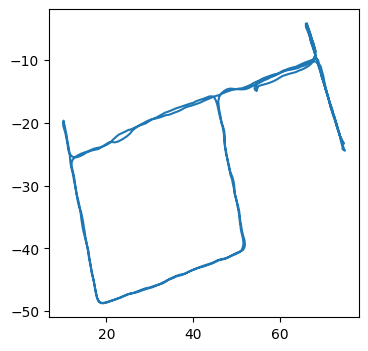

In [1140]:
plt.plot(gt_sync[:,0],gt_sync[:,1])

In [1116]:
distancea  = []
distanceb = []
distancec = []
distanced = []
distancee = []
distancef = []
distanceg = []
distanceh = []
for i in range(len(gt_sync)):
    distancea.append(np.linalg.norm(np.array([gt_sync[i,0],gt_sync[i,1]])-np.array([imu_wifi_offline[i+1,0],imu_wifi_offline[i+1,1]])))
    distanceb.append( np.linalg.norm(np.array([gt_sync[i,0],gt_sync[i,1]])-np.array([imu_wifi_online[i,0],imu_wifi_online[i,1]])))
    distancec.append( np.linalg.norm(np.array([gt_sync[i,0],gt_sync[i,1]])-np.array([imu_offline[i+1,0],imu_offline[i+1,1]])))
    distanced.append( np.linalg.norm(np.array([gt_sync[i,0],gt_sync[i,1]])-np.array([imu_online[i,0],imu_online[i,1]])))
    # distancee.append(np.linalg.norm(np.array([gt_sync[i,0],gt_sync[i,1]])-np.array([wifi_offline[i+1,0],wifi_offline[i+1,1]])))
    # distancef.append( np.linalg.norm(np.array([gt_sync[i,0],gt_sync[i,1]])-np.array([wifi_online[i,0],wifi_online[i,1]])))
    # distanceg.append( np.linalg.norm(np.array([gt_sync[i,0],gt_sync[i,1]])-np.array([none_offline[i+1,0],none_offline[i+1,1]])))
    # distanceh.append( np.linalg.norm(np.array([gt_sync[i,0],gt_sync[i,1]])-np.array([none_online[i,0],none_online[i,1]])))

In [1117]:
# print(np.mean(distanceh),np.mean(distanceg))
# print(np.mean(distancef),np.mean(distancee))
print(np.mean(distanced),np.mean(distancec))
print(np.mean(distanceb),np.mean(distancea))

11.626318012442937 9.877432579398311
7.433324654258726 4.992219722914346


In [1118]:
def draw_cdf(data,ax,K):
    data = np.array(data).astype(float)
    count, bins_count = np.histogram(data, bins=25)
    pdf = count / sum(count)
    cdf = np.cumsum(pdf)
    ax.plot(bins_count[1:], cdf, label=f"{K}")
    ax.legend()
    return ax

FloatingPointError: invalid value encountered in true_divide

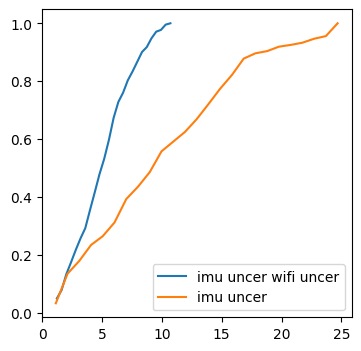

In [1119]:
ax = plt.subplot()
plt.rcParams["figure.figsize"] = (4,4)
draw_cdf(distancea,ax,"imu uncer wifi uncer")
draw_cdf(distancec,ax,"imu uncer")
draw_cdf(distancee,ax,"wifi uncer")
draw_cdf(distanceg,ax,"const uncer")

FloatingPointError: invalid value encountered in true_divide

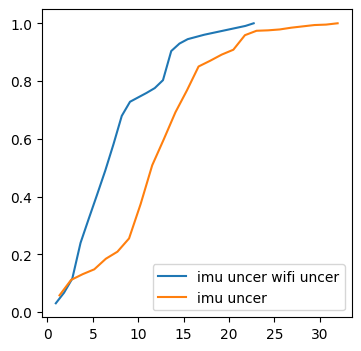

In [1125]:
ax = plt.subplot()
draw_cdf(distanceb,ax,"imu uncer wifi uncer")
draw_cdf(distanced,ax,"imu uncer")
draw_cdf(distancef,ax,"wifi uncer")
draw_cdf(distanceh,ax,"const uncer")

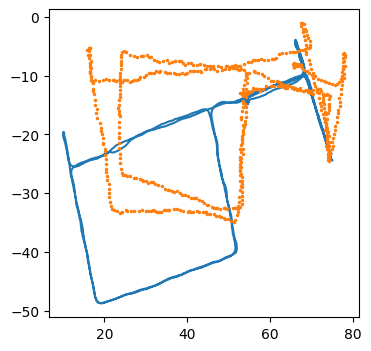

In [1126]:
plt.plot(gt[:,1],gt[:,2])
plt.plot(*zip(*cloud.mean_history()), '.', markersize =3)

In [1127]:
id = 1
while os.path.isfile("../particles_data/dpf_particles_"+str(id)+".npy"):
    id += 1

np.save("../particles_data/dpf_likelihood_"+str(id)+".npy",np.array(gt_likelihood))
np.save("../particles_data/dpf_particles_"+str(id)+".npy",np.array(particle_array))
np.save("../particles_data/dpf_observations_"+str(id)+".npy",np.array(observation_array))
np.save("../particles_data/dpf_gt_"+str(id)+".npy",np.array(gt_array))

In [1123]:
mean = np.array(mean)

In [1124]:
def meter2pixel(x,y,fig_resolution=72,fig_scale=100):

    pix_x=x/0.0254/fig_scale*fig_resolution
    pix_y=-y/0.0254/fig_scale*fig_resolution
    return pix_x,pix_y
    
def pixel2meter(pix_x,pix_y,fig_resolution,fig_scale):
    x=float(pix_x)/fig_resolution*0.0254*fig_scale
    y=-float(pix_y)/fig_resolution*0.0254*fig_scale
    return x,y
wifi_x = []
wifi_y = []
for i in wifi:

    x,y,_,_ = wifi.get(i)[0]
    wifi_x.append(x)
    wifi_y.append(y)
wifi_x = np.array(wifi_x)
wifi_y = np.array(wifi_y)

In [1077]:
wifi_x = []
wifi_y = []
for i in wifi:

    x,y,_,_ = wifi.get(i)[0]
    wifi_x.append(x)
    wifi_y.append(y)
wifi_x = np.array(wifi_x)
wifi_y = np.array(wifi_y)

In [1084]:
px,py = meter2pixel(imu_wifi_online[:,0],imu_wifi_online[:,1])

In [1079]:
offline = np.array(cloud.mean_history())

In [1128]:
offline
off_x,off_y = meter2pixel(imu_wifi_offline[:,0],imu_wifi_offline[:,1])
wifi_x,wifi_y =meter2pixel(wifi_x, wifi_y)

In [1081]:
gt_px,gt_py = meter2pixel(gt[:,1], gt[:,2])

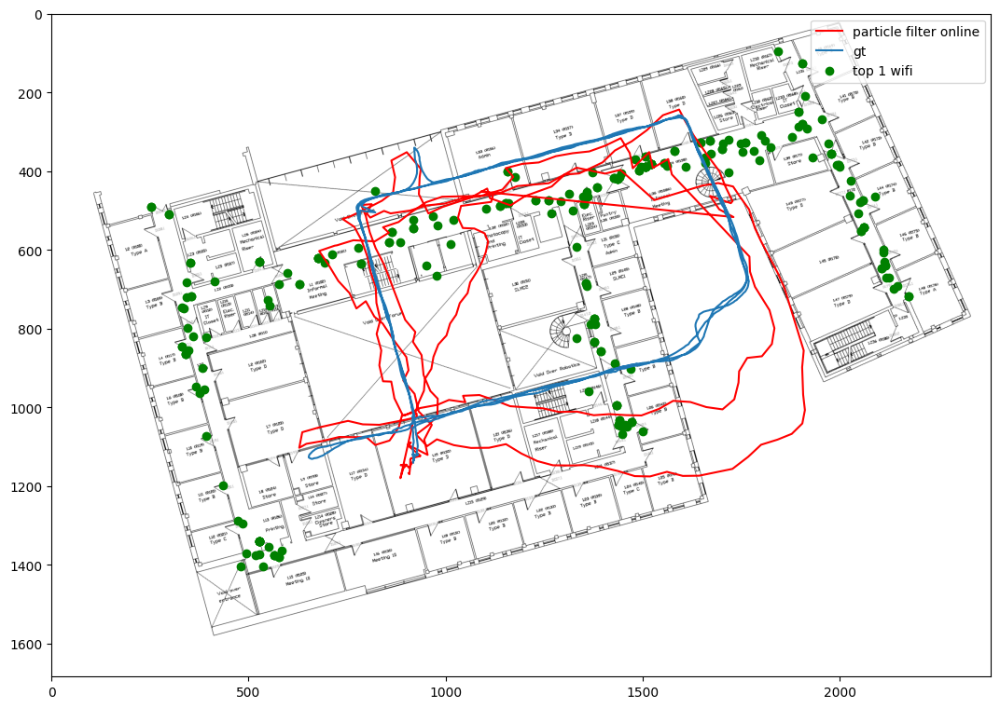

In [1130]:
fp = plt.imread("./F1.png")
plt.rcParams["figure.figsize"] = (13,13)
plt.imshow(fp)
plt.plot(px[:],py[:],c='red',label = 'particle filter online')
plt.plot(gt_px,gt_py,label='gt')
plt.scatter(wifi_x,wifi_y,c='green',label='top 1 wifi')
plt.legend()

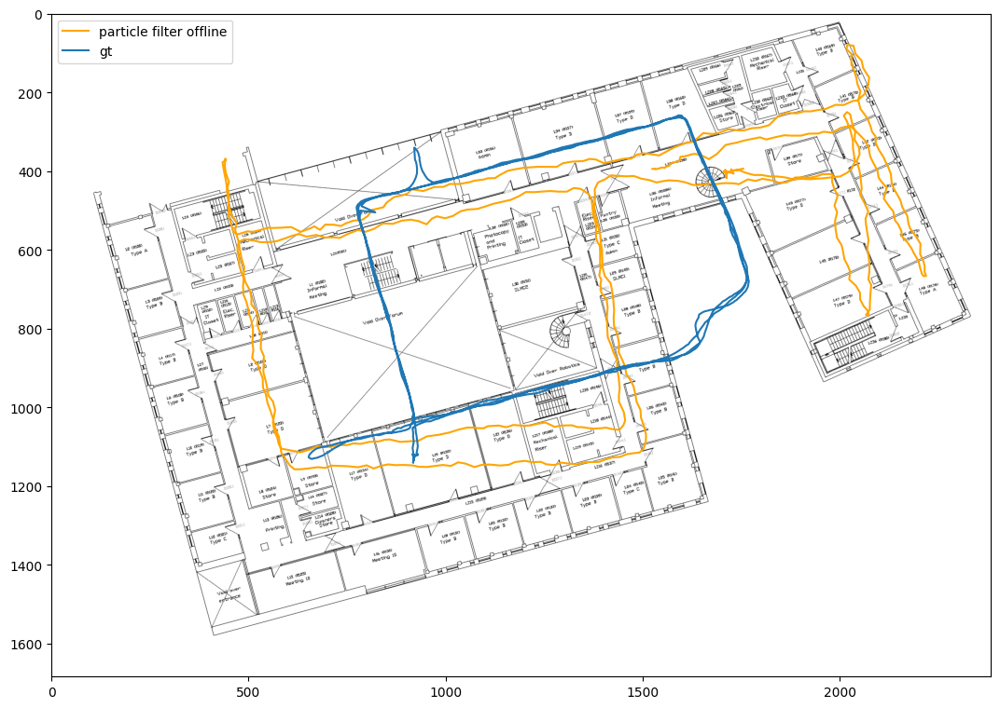

In [1131]:
plt.plot(off_x,off_y,c='orange',label='particle filter offline')
plt.plot(gt_px,gt_py,label='gt')
plt.rcParams["figure.figsize"] = (13,13)
plt.imshow(fp)

# plt.scatter(wifi_x,wifi_y,c='green',label='top1 wifi')
plt.legend()
